# 프로젝트 2: Object Detection
## Faster RCNN
해당 코드는 텐서플로우 공식 홈페이지의 튜토리얼에서 제시된 코드를 활용했습니다.  
먼저 필요한 라이브러리를 불러옵니다.

In [1]:
!pip3 install tensorflow-estimator==2.6.0

In [2]:
# Tensorflow와 Tensoflow Hub에 있는 이미 학습된 모델을 활용하기 위한 모듈 
import tensorflow as tf
import tensorflow_hub as hub

# 이미지를 다운로드하는 데에 사용하는 모듈
import matplotlib.pyplot as plt
import tempfile    # Python에서 임시 파일 및 디렉터리를 다루는데 사용되는 모듈입니다. 임시 파일은 프로그램이 실행되는 동안만 존재하며, 사용이 끝나면 자동으로 삭제됩니다.
from six.moves.urllib.request import urlopen
from six import BytesIO

# 이미지에 선과 폰트를 넣기 위한 모듈
import numpy as np
from PIL import Image
from PIL import ImageColor
from PIL import ImageDraw
from PIL import ImageFont
from PIL import ImageOps

# Detection하는 데에 소요된 시간을 점검하기 위한 모듈
import time

이미지를 시각화하는 함수를 만들어 둡니다.

In [3]:
def display_image(image):
  fig = plt.figure(figsize=(20, 15))
  plt.grid(False)
  plt.imshow(image)

원하는 이미지를 다운로드하고 정해진 가로, 세로 길이에 맞게 이미지를 resizing하는 함수를 만들어둡니다.

In [4]:
def download_and_resize_image(url, new_width=256, new_height=256, display=False): 
  
  _, filename = tempfile.mkstemp(suffix=".jpg")
  response = urlopen(url)
  image_data = response.read()
  image_data = BytesIO(image_data)  # 이미지 데이터 읽기
  pil_image = Image.open(image_data)   # 이미지 열기
  pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.ANTIALIAS) # 이미지 조정 / Image.ANTIALIAS 은 부드럽게 크기를 조정함.
  pil_image_rgb = pil_image.convert("RGB") #RBG로 변환
  pil_image_rgb.save(filename, format="JPEG", quality=90) # 이미지 저장
  print("Image downloaded to %s." % filename)
  if display:
    display_image(pil_image)
  return filename

Bounding Box를 만드는 함수를 만듭니다.

In [5]:
def draw_bounding_box_on_image(image, 
                               ymin, xmin, ymax, xmax,
                               color,
                               font,
                               thickness=4,
                               display_str_list=()):
  
  draw = ImageDraw.Draw(image)
  im_width, im_height = image.size
  (left, right, top, bottom) = (xmin * im_width, xmax * im_width,
                                ymin * im_height, ymax * im_height)

# BBox 테두리 그리기
  draw.line([(left, top), (left, bottom), (right, bottom), (right, top),
             (left, top)],
            width=thickness,
            fill=color)

  display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]
  
  total_display_str_height = (1 + 2 * 0.05) * sum(display_str_heights)

  if top > total_display_str_height:
    text_bottom = top
  else:
    text_bottom = top + total_display_str_height
  
  for display_str in display_str_list[::-1]:
    text_width, text_height = font.getsize(display_str)
    margin = np.ceil(0.05 * text_height)
    draw.rectangle([(left, text_bottom - text_height - 2 * margin),
                    (left + text_width, text_bottom)],
                   fill=color)
    draw.text((left + margin, text_bottom - text_height - margin),
              display_str,
              fill="black",
              font=font)
    text_bottom -= text_height - 2 * margin

이미지 위에 class 이름과 score를 나타내는 함수도 만듭니다.

In [6]:
# BBox 그리기
def draw_boxes(image, boxes, class_names, scores, max_boxes=10, min_score=0.1): 
  colors = list(ImageColor.colormap.values())

  # 텍스트를 표시할 폰트 설정 : 우선 TrueType 폰트를 시도하고, 없을 경우 기본 폰트를 사용
  try:
    font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Regular.ttf",
                              25)
  except IOError:
    print("Font not found, using default font.")
    font = ImageFont.load_default()

# BBox 그리기 적용
  for i in range(min(boxes.shape[0], max_boxes)):
    if scores[i] >= min_score:
      ymin, xmin, ymax, xmax = tuple(boxes[i])  # 박스 좌표값
      # 클래스 이름과 점수를 표시하기 위한 문자열 생성
      display_str = "{}: {}%".format(class_names[i].decode("ascii"),
                                     int(100 * scores[i]))
      color = colors[hash(class_names[i]) % len(colors)]
      image_pil = Image.fromarray(np.uint8(image)).convert("RGB")
      draw_bounding_box_on_image(
          image_pil,
          ymin,
          xmin,
          ymax,
          xmax,
          color,
          font,
          display_str_list=[display_str])
      np.copyto(image, np.array(image_pil))
  return image

이미지를 불러옵니다.  
원하는 이미지를 불러오고, 가로와 세로를 변경해 보는 실험을 진행해 보세요.

Image downloaded to /tmp/tmpihijy92g.jpg.


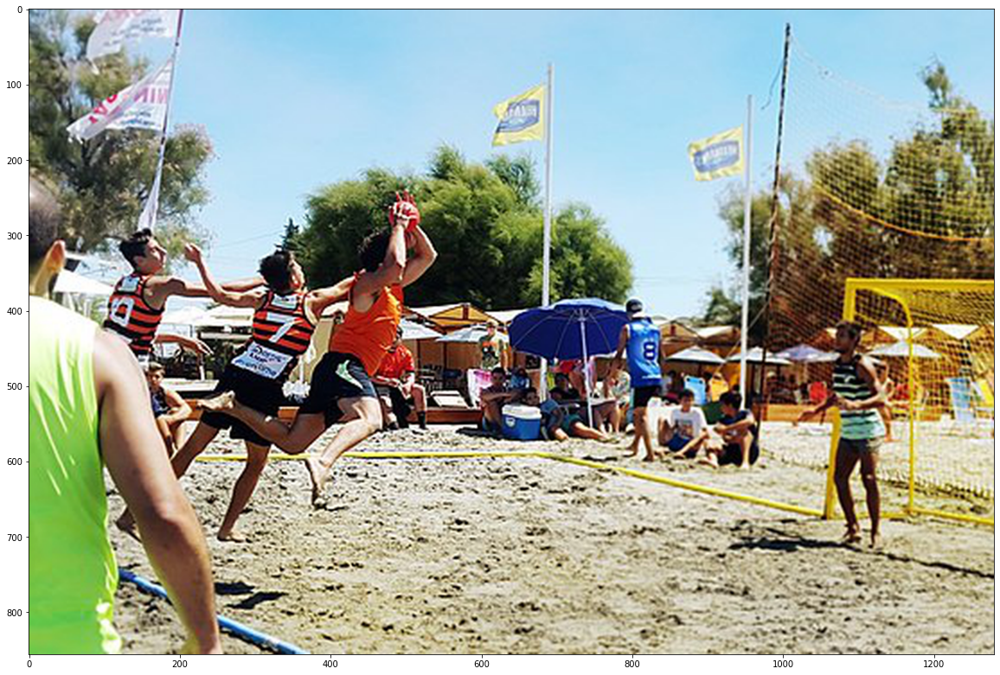

In [7]:
image_url = "https://upload.wikimedia.org/wikipedia/commons/thumb/d/db/Torneo_beach_handball.jpg/640px-Torneo_beach_handball.jpg"
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True)  # new_width와 new_height를 변경해 보세요.

tfhub에서 사전 학습된(Pre-trained) InceptionResnet 모델을 사용한 Faster RCNN 모델을 불러옵니다.

In [8]:
module_handle = "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1"  

detector = hub.load(module_handle).signatures['default'] # detector에 사용할 모듈 저장

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


In [9]:
def load_img(path):
  img = tf.io.read_file(path)
  img = tf.image.decode_jpeg(img, channels=3)
  return img

Detector를 실행하는 함수를 만듭니다.

In [10]:
def run_detector(detector, path):
  img = load_img(path) 

  converted_img  = tf.image.convert_image_dtype(img, tf.float32)[tf.newaxis, ...]

# 소요시간 측정
  start_time = time.time()
  result = detector(converted_img)
  end_time = time.time()

  result = {key:value.numpy() for key,value in result.items()}

# 이미지 추론 개수와 추론 시간 출력
  print("Found %d objects." % len(result["detection_scores"]))
  print("Inference time: ", end_time-start_time)

# 이미지 내 박스로 entity, scores를 추가하여 출력
 # draw_boxes 함수를 사용하여 원본 이미지에 검출된 객체의 바운딩 박스를 그리고, 클래스와 점수를 표시합니다.
  image_with_boxes = draw_boxes(
      img.numpy(), result["detection_boxes"],
      result["detection_class_entities"], result["detection_scores"])

  display_image(image_with_boxes)

detector를 실행시켜 봅시다.

Found 100 objects.
Inference time:  81.74340987205505


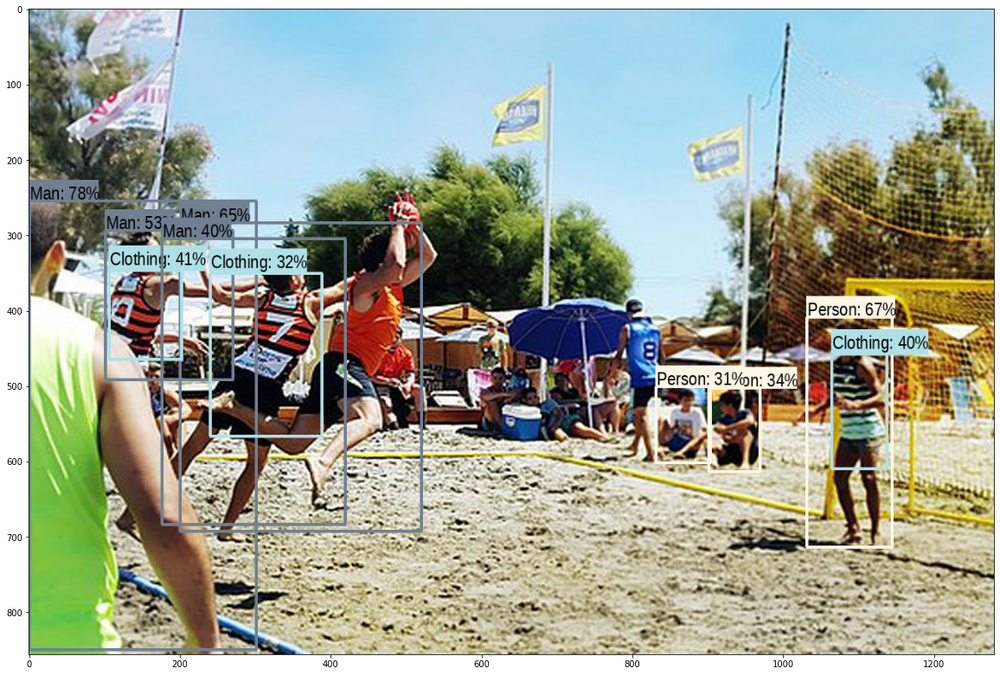

In [12]:
run_detector(detector, downloaded_image_path)

## 문제 2-1. 다른 이미지 테스트해보기
원하는 이미지를 불러와 결과를 확인해 봅시다.

Image downloaded to /tmp/tmp5nw8xqge.jpg.


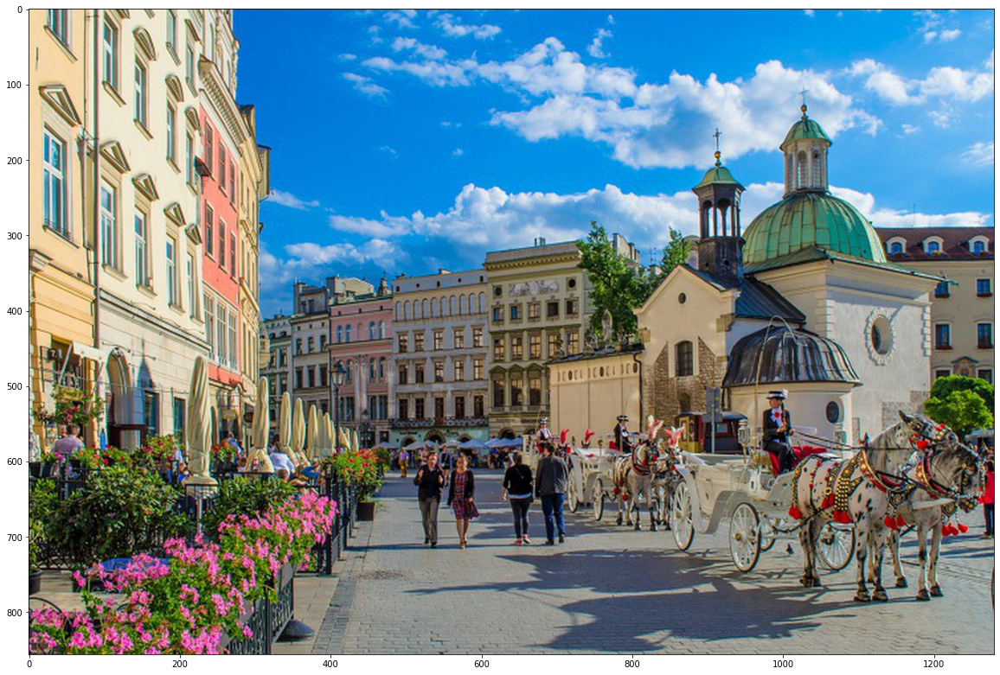

In [18]:
image_url = "https://t1.daumcdn.net/cfile/tistory/99CA3E405C471BA431"
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True)  # new_width와 new_height를 변경해 보세요.

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


Found 100 objects.
Inference time:  34.62254238128662


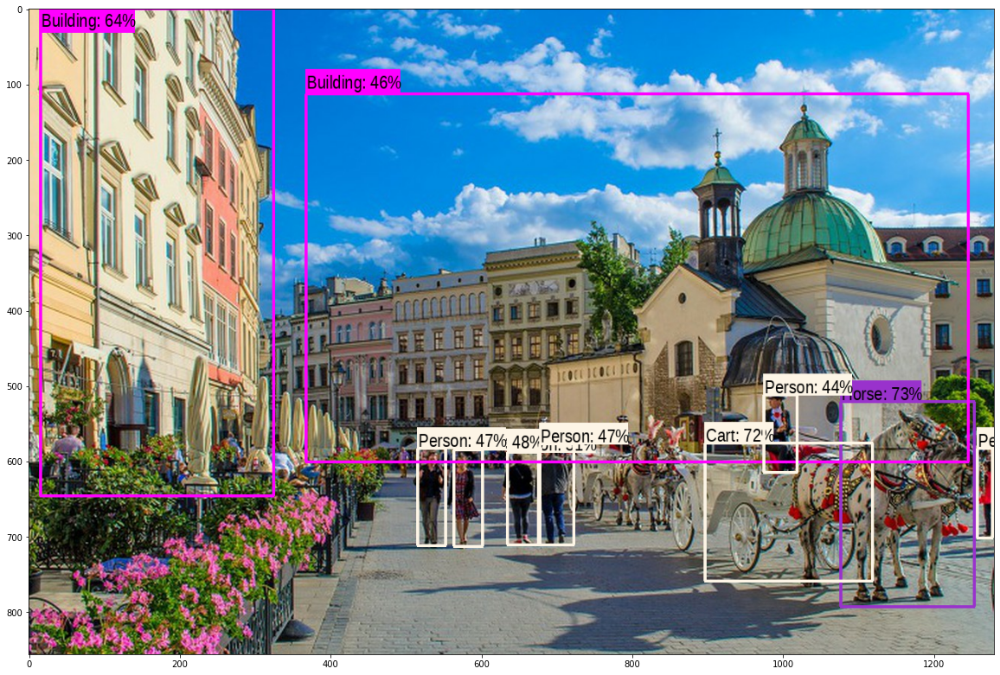

In [19]:
# Faster RCNN 모델 불러오기
module_handle = "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1"  

detector = hub.load(module_handle).signatures['default'] # detector에 사용할 모듈 저장

def load_img(path):
  img = tf.io.read_file(path)
  img = tf.image.decode_jpeg(img, channels=3)
  return img

# Detector를 실행하는 함수
def run_detector(detector, path):
  img = load_img(path) 

  converted_img  = tf.image.convert_image_dtype(img, tf.float32)[tf.newaxis, ...]

# 소요시간 측정
  start_time = time.time()
  result = detector(converted_img)
  end_time = time.time()

  result = {key:value.numpy() for key,value in result.items()}

# 이미지 추론 개수와 추론 시간 출력
  print("Found %d objects." % len(result["detection_scores"]))
  print("Inference time: ", end_time-start_time)

# 이미지 내 박스로 entity, scores를 추가하여 출력
 # draw_boxes 함수를 사용하여 원본 이미지에 검출된 객체의 바운딩 박스를 그리고, 클래스와 점수를 표시합니다.
  image_with_boxes = draw_boxes(
      img.numpy(), result["detection_boxes"],
      result["detection_class_entities"], result["detection_scores"])

  display_image(image_with_boxes)
    
    
# Detector 실행
run_detector(detector, downloaded_image_path)

## 문제 2-2. 다양한 pre-trained model 테스트해보기
Faster RCNN 외에도 Object Detection을 할 수 있는 다양한 사전 학습 모델이 있습니다.   
[tfhub](https://www.kaggle.com/models?tfhub-redirect=true)을 탐색하여 사용할 수 있는 1개 이상의 모델을 불러와 결과를 테스트해보고, 그 결과를 비교해 보세요.

In [31]:
import tensorflow as tf
import tensorflow_hub as hub

# EfficientDet D0 모델 불러오기 (weights='imagenet'으로 사전 훈련된 가중치 사용)
model_url = "https://tfhub.dev/tensorflow/efficientdet/d0/1"
model = hub.load(model_url)

# 모델 요약 출력
model.summary()


AttributeError: '_UserObject' object has no attribute 'summary'

- _UserObject 오류는 TensorFlow Hub로부터 불러온 모델이 TensorFlow Keras 모델이 아니라는 의미.
- TensorFlow Hub에서 EfficientDet D0 모델 불러오기.

In [32]:
import tensorflow as tf
import tensorflow_hub as hub

# EfficientDet D0 모델 불러오기 (weights='imagenet'으로 사전 훈련된 가중치 사용)
model_url = "https://tfhub.dev/tensorflow/efficientdet/d0/1"
model = hub.load(model_url)

# 모델 구조 출력
print(model)

<tensorflow.python.saved_model.load.Loader._recreate_base_user_object.<locals>._UserObject object at 0x7f0379276a30>


In [33]:
# 테스트
from PIL import Image
import requests
from io import BytesIO

# 이미지 URL
image_url = "https://t1.daumcdn.net/cfile/tistory/99CA3E405C471BA431"

# 이미지 다운로드 및 전처리 함수
def load_and_preprocess_image(image_url):
    response = requests.get(image_url)
    image = Image.open(BytesIO(response.content))
    # EfficientDet 모델에 맞는 크기로 이미지 크기 조정
    image = image.resize((512, 512))
    # 이미지를 넘파이 배열로 변환하고 정규화
    image_np = tf.image.convert_image_dtype(image, dtype=tf.float32)[tf.newaxis, ...]
    return image_np

# 이미지 로드 및 전처리
image_np = load_and_preprocess_image(image_url)

In [34]:
# 추론 수행
results = model(image_np)

ValueError: Python inputs incompatible with input_signature:
  inputs: (
    tf.Tensor(
[[[[0.9607844  0.8431373  0.6509804 ]
   [0.9607844  0.8352942  0.67058825]
   [0.95294124 0.83921576 0.68235296]
   ...
   [0.23137257 0.6509804  0.9333334 ]
   [0.26666668 0.654902   0.9294118 ]
   [0.30980393 0.68235296 0.95294124]]

  [[0.9607844  0.8431373  0.6509804 ]
   [0.9568628  0.83921576 0.67058825]
   [0.95294124 0.83921576 0.6745098 ]
   ...
   [0.24705884 0.654902   0.92549026]
   [0.28627452 0.6666667  0.9294118 ]
   [0.33333334 0.69803923 0.9568628 ]]

  [[0.9607844  0.8431373  0.6431373 ]
   [0.9568628  0.83921576 0.6627451 ]
   [0.95294124 0.83921576 0.6745098 ]
   ...
   [0.27058825 0.65882355 0.91372555]
   [0.3137255  0.6784314  0.9294118 ]
   [0.36078432 0.70980394 0.9568628 ]]

  ...

  [[0.3921569  0.15294118 0.31764707]
   [0.8196079  0.3019608  0.5686275 ]
   [0.8745099  0.32156864 0.7137255 ]
   ...
   [0.6156863  0.63529414 0.60784316]
   [0.6156863  0.6392157  0.6117647 ]
   [0.62352943 0.654902   0.61960787]]

  [[0.4901961  0.1764706  0.37254903]
   [0.909804   0.2509804  0.6431373 ]
   [0.96470594 0.2509804  0.7686275 ]
   ...
   [0.61960787 0.6392157  0.6117647 ]
   [0.6039216  0.62352943 0.59607846]
   [0.59607846 0.62352943 0.5921569 ]]

  [[0.7411765  0.3647059  0.5686275 ]
   [0.8196079  0.10196079 0.56078434]
   [0.96470594 0.2627451  0.8000001 ]
   ...
   [0.5882353  0.60784316 0.5803922 ]
   [0.5882353  0.6117647  0.58431375]
   [0.59607846 0.62352943 0.5921569 ]]]], shape=(1, 512, 512, 3), dtype=float32))
  input_signature: (
    TensorSpec(shape=(1, None, None, 3), dtype=tf.uint8, name=None))

에러 원인  
- 모델이 tf.uint8 타입의 입력을 예상하고 있지만, 입력 데이터가 tf.float32 타입임.
- 코드에서 이미지를 정규화한 후에 모델에 전달하고 있는데, 모델은 정규화되지 않은 원본 이미지를 예상하고 있다.  
이미지를 정규화하지 않고 모델에 전달하는 코드로 다시 작성하기

In [35]:
# 이미지 URL
image_url = "https://t1.daumcdn.net/cfile/tistory/99CA3E405C471BA431"

# 이미지 다운로드 및 전처리 함수
def load_and_preprocess_image(image_url):
    response = requests.get(image_url)
    image = Image.open(BytesIO(response.content))
    # EfficientDet 모델에 맞는 크기로 이미지 크기 조정
    image = image.resize((512, 512))
    # 이미지를 넘파이 배열로 변환하고 정규화하지 않음
    image_np = tf.image.convert_image_dtype(image, dtype=tf.uint8)[tf.newaxis, ...]
    return image_np

# 이미지 로드 및 전처리
image_np = load_and_preprocess_image(image_url)

# 추론 수행
results = model(image_np)

In [36]:
# Tensorflow와 Tensoflow Hub에 있는 이미 학습된 모델을 활용하기 위한 모듈 
import tensorflow as tf
import tensorflow_hub as hub

# 이미지를 다운로드하는 데에 사용하는 모듈
import matplotlib.pyplot as plt
import tempfile    # Python에서 임시 파일 및 디렉터리를 다루는데 사용되는 모듈입니다. 임시 파일은 프로그램이 실행되는 동안만 존재하며, 사용이 끝나면 자동으로 삭제됩니다.
from six.moves.urllib.request import urlopen
from six import BytesIO

# 이미지에 선과 폰트를 넣기 위한 모듈
import numpy as np
from PIL import Image
from PIL import ImageColor
from PIL import ImageDraw
from PIL import ImageFont
from PIL import ImageOps

# Detection하는 데에 소요된 시간을 점검하기 위한 모듈
import time

In [38]:
# 이미지 시각화 함수 만들기
def display_image(image):
  fig = plt.figure(figsize=(20, 15))
  plt.grid(False)
  plt.imshow(image)

In [39]:
# 이미지 다운로드 및 resize
def download_and_resize_image(url, new_width=256, new_height=256, display=False): 
  
  _, filename = tempfile.mkstemp(suffix=".jpg")
  response = urlopen(url)
  image_data = response.read()
  image_data = BytesIO(image_data)  # 이미지 데이터 읽기
  pil_image = Image.open(image_data)   # 이미지 열기
  pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.ANTIALIAS) # 이미지 조정 / Image.ANTIALIAS 은 부드럽게 크기를 조정함.
  pil_image_rgb = pil_image.convert("RGB") #RBG로 변환
  pil_image_rgb.save(filename, format="JPEG", quality=90) # 이미지 저장
  print("Image downloaded to %s." % filename)
  if display:
    display_image(pil_image)
  return filename

In [40]:
# Bounding Box 만드는 함수 만들기
def draw_bounding_box_on_image(image, 
                               ymin, xmin, ymax, xmax,
                               color,
                               font,
                               thickness=4,
                               display_str_list=()):
  
  draw = ImageDraw.Draw(image)
  im_width, im_height = image.size
  (left, right, top, bottom) = (xmin * im_width, xmax * im_width,
                                ymin * im_height, ymax * im_height)

# BBox 테두리 그리기
  draw.line([(left, top), (left, bottom), (right, bottom), (right, top),
             (left, top)],
            width=thickness,
            fill=color)

  display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]
  
  total_display_str_height = (1 + 2 * 0.05) * sum(display_str_heights)

  if top > total_display_str_height:
    text_bottom = top
  else:
    text_bottom = top + total_display_str_height
  
  for display_str in display_str_list[::-1]:
    text_width, text_height = font.getsize(display_str)
    margin = np.ceil(0.05 * text_height)
    draw.rectangle([(left, text_bottom - text_height - 2 * margin),
                    (left + text_width, text_bottom)],
                   fill=color)
    draw.text((left + margin, text_bottom - text_height - margin),
              display_str,
              fill="black",
              font=font)
    text_bottom -= text_height - 2 * margin

In [41]:
# 이미지 위에 class이름과 score 나타내는 함수 만들기
# BBox 그리기
def draw_boxes(image, boxes, class_names, scores, max_boxes=10, min_score=0.1): 
  colors = list(ImageColor.colormap.values())

  # 텍스트를 표시할 폰트 설정 : 우선 TrueType 폰트를 시도하고, 없을 경우 기본 폰트를 사용
  try:
    font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Regular.ttf",
                              25)
  except IOError:
    print("Font not found, using default font.")
    font = ImageFont.load_default()

# BBox 그리기 적용
  for i in range(min(boxes.shape[0], max_boxes)):
    if scores[i] >= min_score:
      ymin, xmin, ymax, xmax = tuple(boxes[i])  # 박스 좌표값
      # 클래스 이름과 점수를 표시하기 위한 문자열 생성
      display_str = "{}: {}%".format(class_names[i].decode("ascii"),
                                     int(100 * scores[i]))
      color = colors[hash(class_names[i]) % len(colors)]
      image_pil = Image.fromarray(np.uint8(image)).convert("RGB")
      draw_bounding_box_on_image(
          image_pil,
          ymin,
          xmin,
          ymax,
          xmax,
          color,
          font,
          display_str_list=[display_str])
      np.copyto(image, np.array(image_pil))
  return image

Image downloaded to /tmp/tmpuhe85adz.jpg.


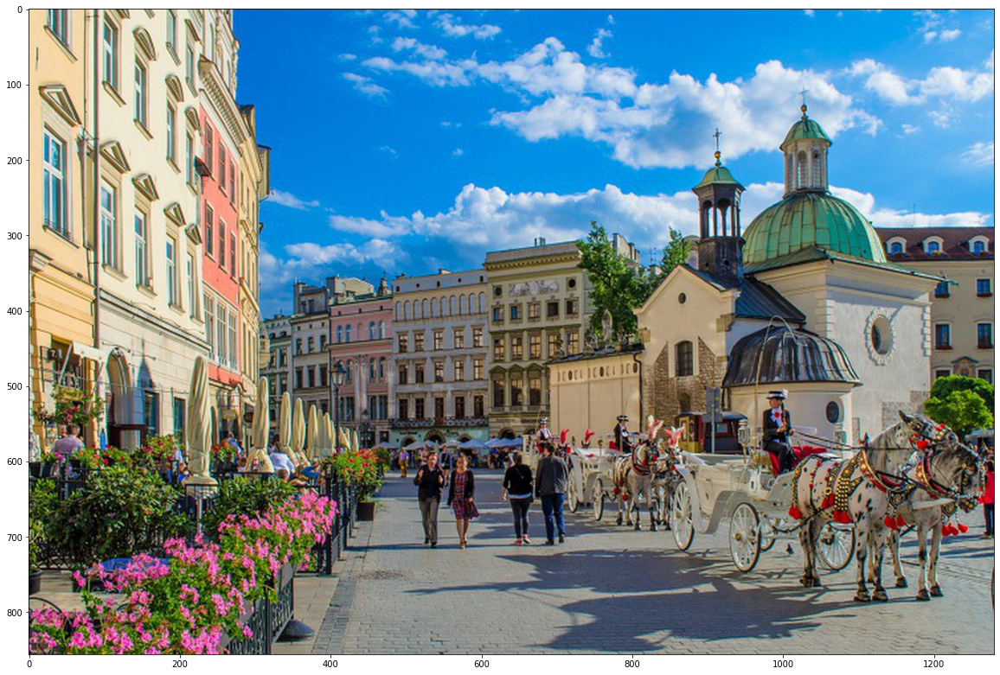

In [42]:
# 이미지 불러오기
image_url = "https://t1.daumcdn.net/cfile/tistory/99CA3E405C471BA431"
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True)  # new_width와 new_height를 변경해 보세요.

In [44]:
module_handle = "https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/035-128-classification/versions/2"  

detector = hub.load(module_handle) # detector에 사용할 모듈 저장
print(detector.signatures.keys())

KeysView(_SignatureMap({'serving_default': <ConcreteFunction signature_wrapper(*, inputs) at 0x7F03489DB940>}))


In [45]:
detector = hub.load(module_handle).signatures['serving_default']

In [46]:
def load_img(path):
  img = tf.io.read_file(path)
  img = tf.image.decode_jpeg(img, channels=3)
  return img

In [47]:
# Detector 실행하는 함수 만들기
def run_detector(detector, path):
  img = load_img(path) 

  converted_img  = tf.image.convert_image_dtype(img, tf.float32)[tf.newaxis, ...]

# 소요시간 측정
  start_time = time.time()
  result = detector(converted_img)
  end_time = time.time()

  result = {key:value.numpy() for key,value in result.items()}

# 이미지 추론 개수와 추론 시간 출력
  print("Found %d objects." % len(result["detection_scores"]))
  print("Inference time: ", end_time-start_time)

# 이미지 내 박스로 entity, scores를 추가하여 출력
 # draw_boxes 함수를 사용하여 원본 이미지에 검출된 객체의 바운딩 박스를 그리고, 클래스와 점수를 표시합니다.
  image_with_boxes = draw_boxes(
      img.numpy(), result["detection_boxes"],
      result["detection_class_entities"], result["detection_scores"])

  display_image(image_with_boxes)

In [48]:
# Detector 실행
run_detector(detector, downloaded_image_path)

FailedPreconditionError:  Could not find variable _AnonymousVar2083. This could mean that the variable has been deleted. In TF1, it can also mean the variable is uninitialized. Debug info: container=localhost, status=Not found: Resource localhost/_AnonymousVar2083/N10tensorflow3VarE does not exist.
	 [[{{node StatefulPartitionedCall/StatefulPartitionedCall/predict/MobilenetV2/expanded_conv_11/project/Conv2D/ReadVariableOp}}]] [Op:__inference_signature_wrapper_582172]

Function call stack:
signature_wrapper


In [ ]:
# 문제 2-2. 결과 비교
print("1번째 모델인 Inception ResNet을 사용한 Faster RCNN은 조금 느리지만 높은 정확성을 보였습니다.") 
print("2번째 모델인 ...")